In [1]:
# -*- coding: utf-8 -*-
# -*- author : Vincent Roduit - Yannis Laaroussi - Fabio Palmisano -*-
# -*- date : 2024-03-15 -*-
# -*- Last revision: 2024-03-15 (Vincent Roduit)-*-
# -*- python version : 3.11.7 -*-
# -*- Description: Notebook that summarizes results-*-

# <center> COM - 480: Data Visualization</center>
## <center> Ecole Polytechnique Fédérale de Lausanne </center>
### <center> Olympic Games Visualization </center>
---

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load Data

You can download the Data from this website:

In [2]:
DATA_PATH = "../data/"
df_athletes = pd.read_csv(os.path.join(DATA_PATH, 'olympic_athletes.csv'))
df_hosts = pd.read_csv(os.path.join(DATA_PATH, 'olympic_hosts.csv'))
df_medals = pd.read_csv(os.path.join(DATA_PATH, 'olympic_medals.csv'))
df_results = pd.read_csv(os.path.join(DATA_PATH, 'olympic_results.csv'))

# 2. Preliminary Analysis

## 2.1 athletes

In [3]:
df_athletes.head(10)

,athlete_url,athlete_full_name,games_participations,first_game,athlete_year_birth,athlete_medals,bio
0,https://olympics.com/en/athletes/cooper-woods-...,Cooper WOODS-TOPALOVIC,1,Beijing 2022,2000.0,NaN,NaN
1,https://olympics.com/en/athletes/elofsson,Felix ELOFSSON,2,PyeongChang 2018,1995.0,NaN,NaN
2,https://olympics.com/en/athletes/dylan-walczyk,Dylan WALCZYK,1,Beijing 2022,1993.0,NaN,NaN
3,https://olympics.com/en/athletes/olli-penttala,Olli PENTTALA,1,Beijing 2022,1995.0,NaN,NaN
4,https://olympics.com/en/athletes/reikherd,Dmitriy REIKHERD,1,Beijing 2022,1989.0,NaN,NaN
5,https://olympics.com/en/athletes/matt-graham,Matt GRAHAM,3,Sochi 2014,1994.0,\r\n\r\n\r\n1\r\n\r\nS\r\n\r\n,NaN
6,https://olympics.com/en/athletes/ikuma-horishima,Ikuma HORISHIMA,2,PyeongChang 2018,1997.0,\r\n\r\n\r\n1\r\n\r\nB\r\n\r\n,NaN
7,https://olympics.com/en/athletes/daichi-hara,Daichi HARA,2,PyeongChang 2018,1997.0,\r\n\r\n\r\n1\r\n\r\nB\r\n\r\n,NaN
8,https://olympics.com/en/athletes/laurent-dumais,Laurent DUMAIS,1,Beijing 2022,1996.0,NaN,NaN
9,https://olympics.com/en/athletes/james-matheson,James MATHESON,2,PyeongChang 2018,1995.0,NaN,NaN


In [4]:
df_athletes.describe()

,games_participations,athlete_year_birth
count,75904.000000,73448.000000
mean,1.535874,1961.619377
std,0.854563,28.129576
min,0.000000,1836.000000
25%,1.000000,1946.000000
50%,1.000000,1968.000000
75%,2.000000,1983.000000
max,10.000000,2009.000000


### Athletes participations

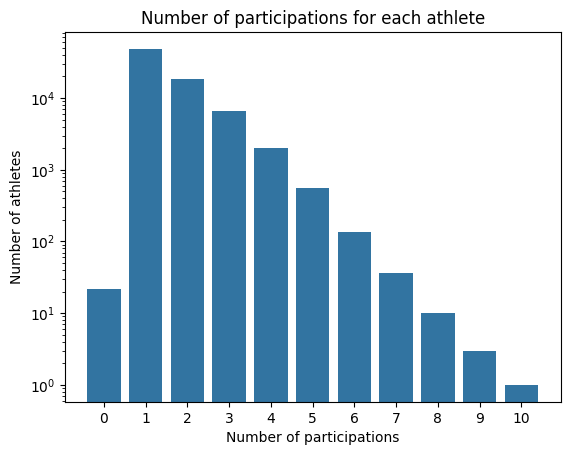

In [5]:
# Plot the number of participation for each athlete
participations = df_athletes['games_participations'].value_counts().reset_index()
sns.barplot(x='games_participations', y='count', data=participations)
plt.title('Number of participations for each athlete')
plt.xlabel('Number of participations')
plt.ylabel('Number of athletes')
plt.semilogy()
plt.show()

## 2.2 Hosts

In [6]:
df_hosts.head(5)

,game_slug,game_end_date,game_start_date,game_location,game_name,game_season,game_year
0,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022
1,tokyo-2020,2021-08-08T14:00:00Z,2021-07-23T11:00:00Z,Japan,Tokyo 2020,Summer,2020
2,pyeongchang-2018,2018-02-25T08:00:00Z,2018-02-08T23:00:00Z,Republic of Korea,PyeongChang 2018,Winter,2018
3,rio-2016,2016-08-21T21:00:00Z,2016-08-05T12:00:00Z,Brazil,Rio 2016,Summer,2016
4,sochi-2014,2014-02-23T16:00:00Z,2014-02-07T04:00:00Z,Russian Federation,Sochi 2014,Winter,2014


In [94]:
#Number of olympic games 
nb_games = df_hosts['game_slug'].nunique()
nb_locations = df_hosts['game_location'].nunique()
print(f'There are {nb_games} different Olympic games and {nb_locations} different countries that hosted the games')

There are 53 different Olympic games and 26 different countries that hosted the games


### Plot Hostings per country

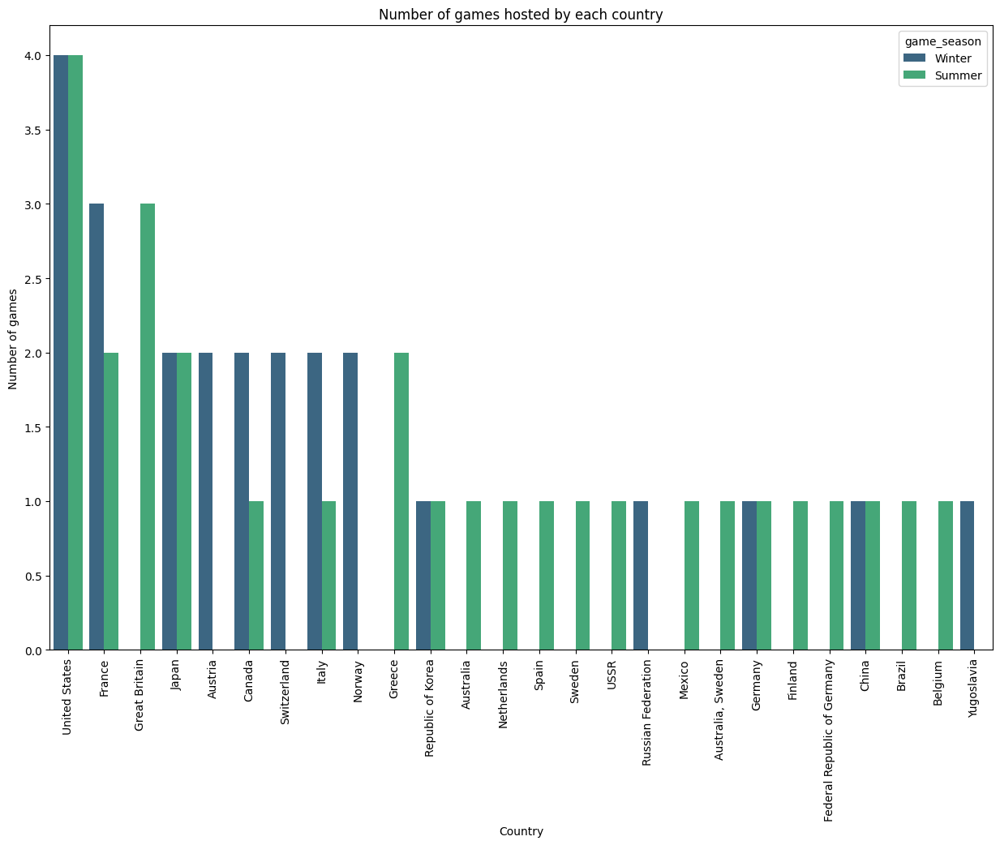

In [8]:
#Number of games hosted by each country
plt.figure(figsize=(15, 10))
games_by_country = df_hosts[['game_location','game_season']].value_counts().reset_index()
sns.barplot(data=games_by_country, x='game_location',y='count',hue='game_season', palette='viridis')
plt.title('Number of games hosted by each country')
plt.xlabel('Country')
plt.ylabel('Number of games')
plt.xticks(rotation=90)
plt.show()

## 2.3 Medals

In [9]:
df_medals = df_medals.merge(df_hosts, left_on='slug_game', right_on='game_slug')

In [10]:
df_medals.head(5)

,discipline_title,slug_game,event_title,event_gender,medal_type,participant_type,participant_title,athlete_url,athlete_full_name,country_name,country_code,country_3_letter_code,game_slug,game_end_date,game_start_date,game_location,game_name,game_season,game_year
0,Curling,beijing-2022,Mixed Doubles,Mixed,GOLD,GameTeam,Italy,https://olympics.com/en/athletes/stefania-cons...,Stefania CONSTANTINI,Italy,IT,ITA,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022
1,Curling,beijing-2022,Mixed Doubles,Mixed,GOLD,GameTeam,Italy,https://olympics.com/en/athletes/amos-mosaner,Amos MOSANER,Italy,IT,ITA,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022
2,Curling,beijing-2022,Mixed Doubles,Mixed,SILVER,GameTeam,Norway,https://olympics.com/en/athletes/kristin-skaslien,Kristin SKASLIEN,Norway,NO,NOR,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022
3,Curling,beijing-2022,Mixed Doubles,Mixed,SILVER,GameTeam,Norway,https://olympics.com/en/athletes/magnus-nedreg...,Magnus NEDREGOTTEN,Norway,NO,NOR,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022
4,Curling,beijing-2022,Mixed Doubles,Mixed,BRONZE,GameTeam,Sweden,https://olympics.com/en/athletes/almida-de-val,Almida DE VAL,Sweden,SE,SWE,beijing-2022,2022-02-20T12:00:00Z,2022-02-04T15:00:00Z,China,Beijing 2022,Winter,2022


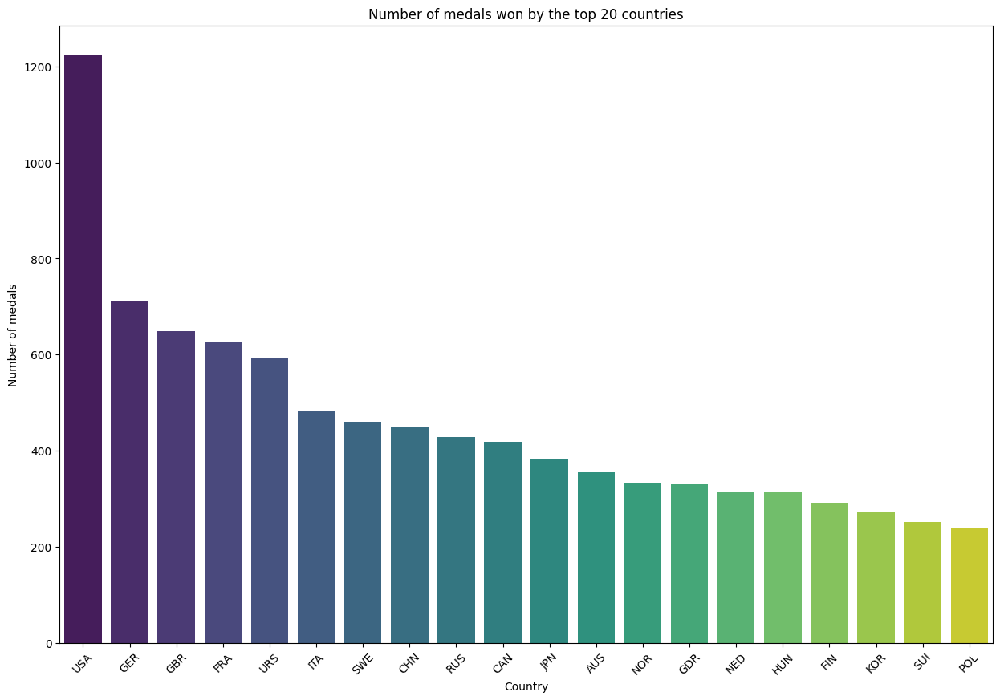

In [11]:
#Number of medals won by each country
plt.figure(figsize=(15, 10))
medals_by_country = df_medals.drop_duplicates(subset=['medal_type','participant_type','event_title','discipline_title','country_3_letter_code'])
medals_by_country = medals_by_country['country_3_letter_code'].value_counts().reset_index().sort_values(by='count', ascending=False)
sns.barplot(data=medals_by_country.head(20), x='country_3_letter_code',y='count', palette='viridis')
plt.title('Number of medals won by the top 20 countries')
plt.xlabel('Country')
plt.ylabel('Number of medals')
plt.xticks(rotation=45)
plt.show()

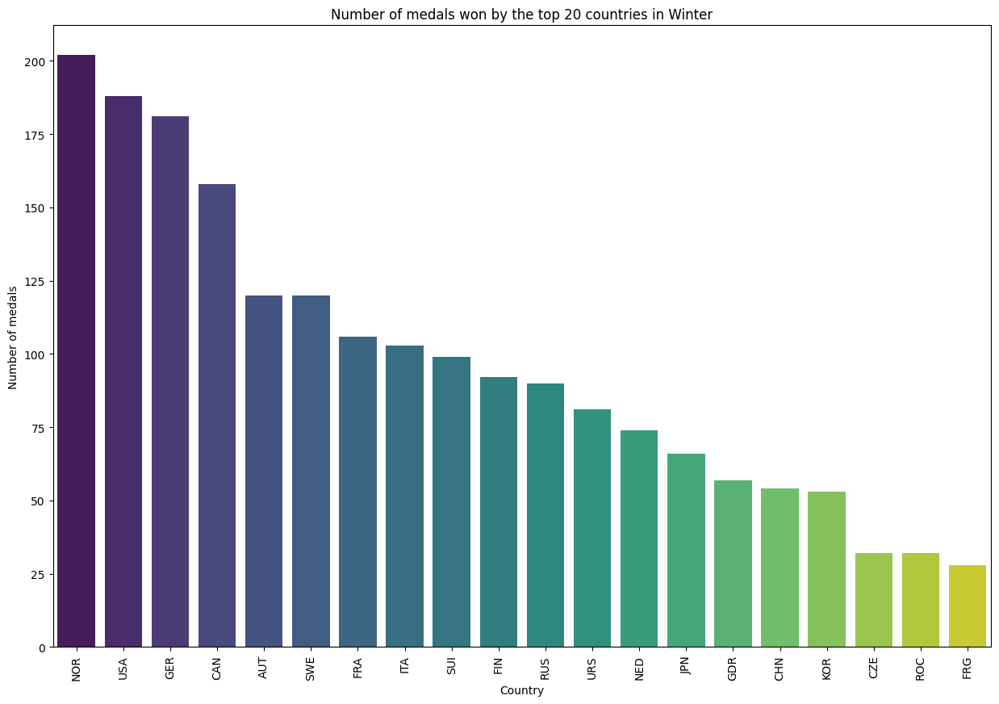

In [12]:
#Number of medals won by each country in Winter
plt.figure(figsize=(15, 10))
medals_by_country = df_medals.drop_duplicates(subset=['medal_type','participant_type','event_title','discipline_title','country_3_letter_code'])
medals_by_country_winter = medals_by_country[['country_3_letter_code','game_season']].query('game_season == "Winter"')
medals_by_country_winter = medals_by_country_winter['country_3_letter_code'].value_counts().reset_index().sort_values(by='count', ascending=False)
sns.barplot(data=medals_by_country_winter.head(20), x='country_3_letter_code',y='count', palette='viridis')
plt.title('Number of medals won by the top 20 countries in Winter')
plt.xlabel('Country')
plt.ylabel('Number of medals')
plt.xticks(rotation=90)
plt.show()

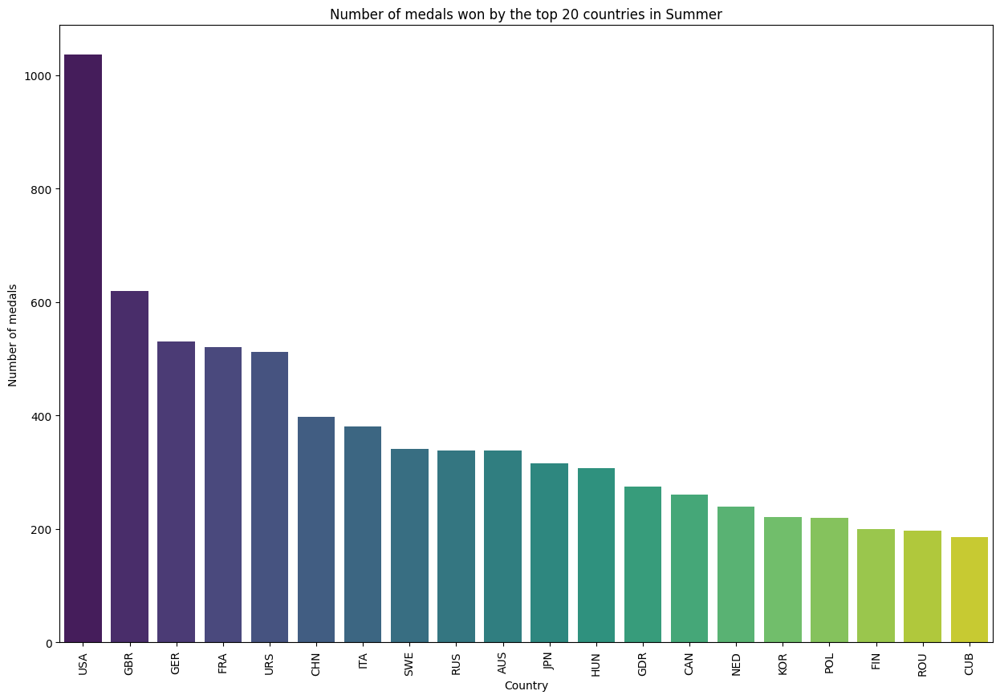

In [13]:
#Number of medals won by each country in Summer
plt.figure(figsize=(15, 10))
medals_by_country_summer = df_medals.drop_duplicates(subset=['medal_type','participant_type','event_title','discipline_title','country_3_letter_code'])
medals_by_country_summer = medals_by_country_summer[['country_3_letter_code','game_season']].query('game_season == "Summer"')
medals_by_country_summer = medals_by_country_summer['country_3_letter_code'].value_counts().reset_index().sort_values(by='count', ascending=False)
sns.barplot(data=medals_by_country_summer.head(20), x='country_3_letter_code',y='count', palette='viridis')
plt.title('Number of medals won by the top 20 countries in Summer')
plt.xlabel('Country')
plt.ylabel('Number of medals')
plt.xticks(rotation=90)
plt.show()

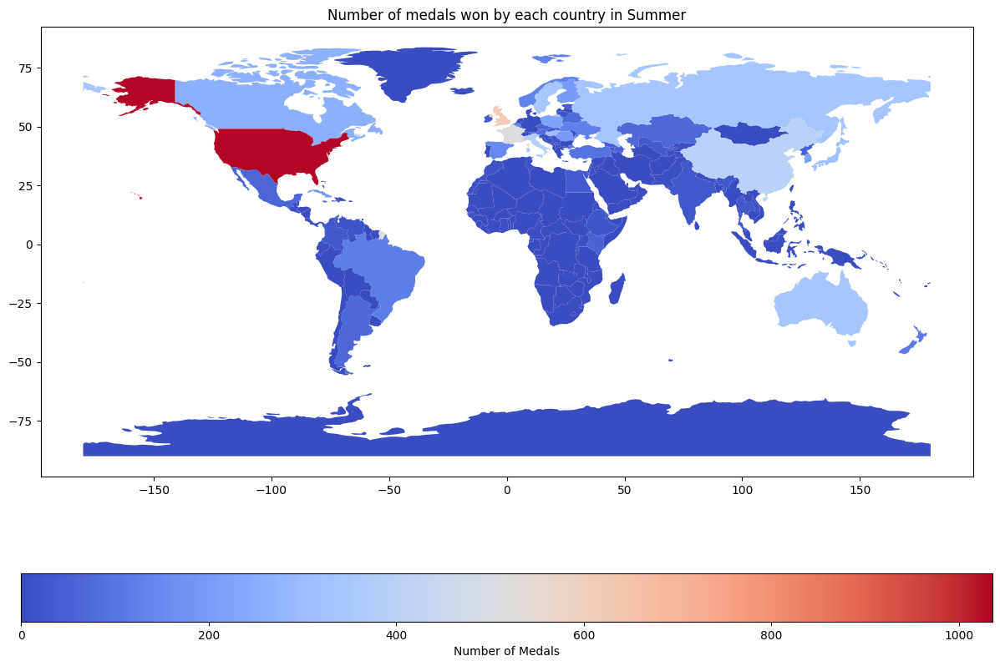

In [14]:
# Get the world geometry
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

medals_by_country_summer.rename(columns={'country_3_letter_code': 'iso_a3'}, inplace=True)

world_medals = world.merge(medals_by_country_summer, how='left', on='iso_a3')

# Fill NaN values with 0
world_medals['count'] = world_medals['count'].fillna(0)

#plot result
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world_medals.plot(column='count', ax=ax, legend=True, cmap='coolwarm', 
                  legend_kwds={'label': "Number of Medals", 'orientation': "horizontal"})
plt.title('Number of medals won by each country in Summer')
plt.show()

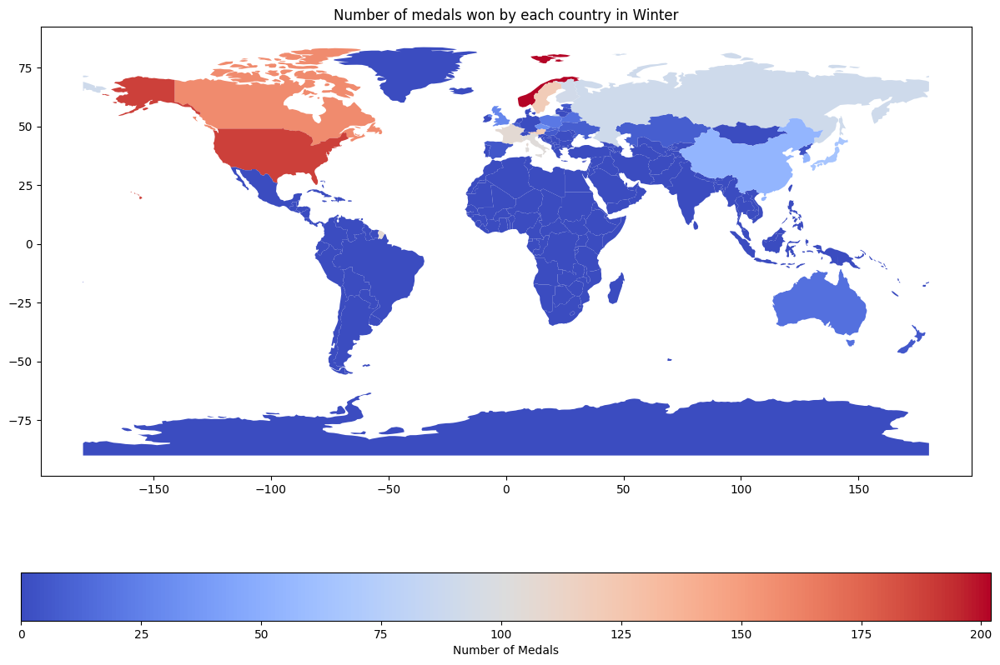

In [15]:
# Get the world geometry
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

medals_by_country_winter.rename(columns={'country_3_letter_code': 'iso_a3'}, inplace=True)

world_medals = world.merge(medals_by_country_winter, how='left', on='iso_a3')

# Fill NaN values with 0
world_medals['count'] = world_medals['count'].fillna(0)

#plot result
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world_medals.plot(column='count', ax=ax, legend=True, cmap='coolwarm', 
                  legend_kwds={'label': "Number of Medals", 'orientation': "horizontal"})
plt.title('Number of medals won by each country in Winter')
plt.show()

# Results

In [16]:
df_results.head(5)

,discipline_title,event_title,slug_game,participant_type,medal_type,athletes,rank_equal,rank_position,country_name,country_code,country_3_letter_code,athlete_url,athlete_full_name,value_unit,value_type
0,Curling,Mixed Doubles,beijing-2022,GameTeam,GOLD,"[('Stefania CONSTANTINI', 'https://olympics.co...",False,1,Italy,IT,ITA,NaN,NaN,NaN,NaN
1,Curling,Mixed Doubles,beijing-2022,GameTeam,SILVER,"[('Kristin SKASLIEN', 'https://olympics.com/en...",False,2,Norway,NO,NOR,NaN,NaN,NaN,NaN
2,Curling,Mixed Doubles,beijing-2022,GameTeam,BRONZE,"[('Almida DE VAL', 'https://olympics.com/en/at...",False,3,Sweden,SE,SWE,NaN,NaN,NaN,NaN
3,Curling,Mixed Doubles,beijing-2022,GameTeam,NaN,"[('Jennifer DODDS', 'https://olympics.com/en/a...",False,4,Great Britain,GB,GBR,NaN,NaN,NaN,NaN
4,Curling,Mixed Doubles,beijing-2022,GameTeam,NaN,"[('Rachel HOMAN', 'https://olympics.com/en/ath...",False,5,Canada,CA,CAN,NaN,NaN,NaN,NaN


In [17]:
df_results.describe()

,discipline_title,event_title,slug_game,participant_type,medal_type,athletes,rank_equal,rank_position,country_name,country_code,country_3_letter_code,athlete_url,athlete_full_name,value_unit,value_type
count,162804,162804,162804,162804,20206,7976,32526,158926,162804,157768,162804,129991,141646,78646,90049
unique,86,1567,53,2,3,6845,2,193,238,213,233,68104,75263,46475,12
top,Athletics,individual mixed,rio-2016,Athlete,BRONZE,"[('LETOT LETOT', 'https://olympics.com/en/athl...",True,9,United States of America,US,USA,https://olympics.com/en/athletes/heikki-savola...,Heikki SAVOLAINEN,same time,TIME
freq,19259,2731,7672,141646,7029,37,23613,8279,11916,11916,11916,34,34,99,43774


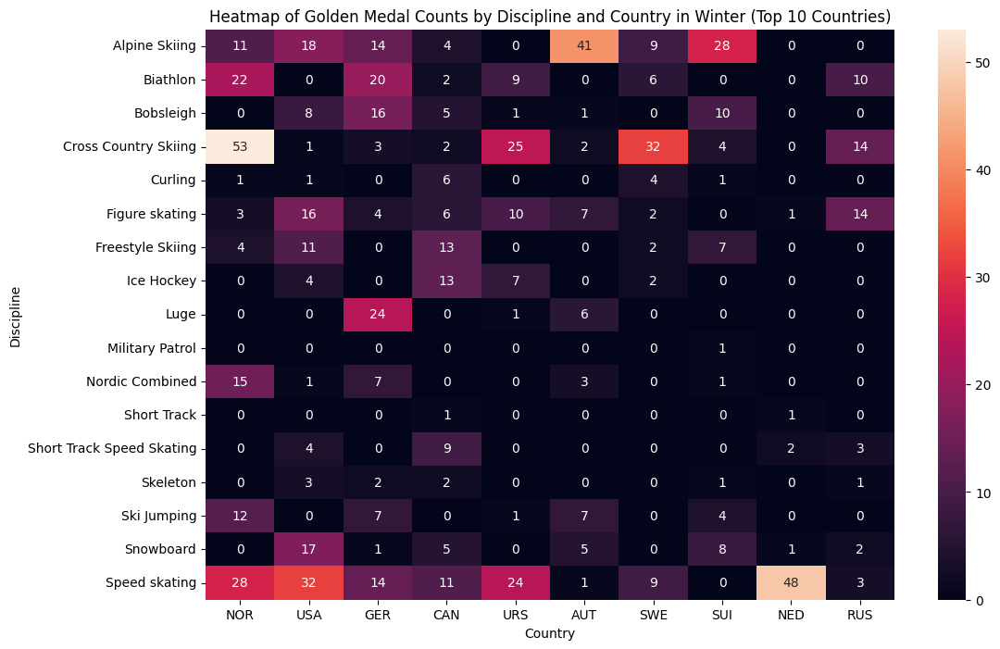

In [18]:
df_results_gold = df_results[df_results['rank_position'] == '1']
df_results_gold = df_results_gold.merge(df_hosts, left_on='slug_game', right_on='game_slug')

df_results_gold_summer = df_results_gold.query('game_season == "Summer"')
df_results_gold_winter = df_results_gold.query('game_season == "Winter"')

heatmap_summer = df_results_gold_summer.groupby(['discipline_title', 'country_3_letter_code']).size().unstack().fillna(0)
heatmap_winter = df_results_gold_winter.groupby(['discipline_title', 'country_3_letter_code']).size().unstack().fillna(0)

# Get the top 10 countries according to their number of medals
top_10_countries_summer = heatmap_summer.sum().nlargest(10).index
top_10_countries_winter = heatmap_winter.sum().nlargest(10).index

heatmap_summer = heatmap_summer[top_10_countries_summer]
heatmap_winter = heatmap_winter[top_10_countries_winter]

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_winter, annot=True)
plt.title('Heatmap of Golden Medal Counts by Discipline and Country in Winter (Top 10 Countries)')
plt.xlabel('Country')
plt.ylabel('Discipline')
plt.show()

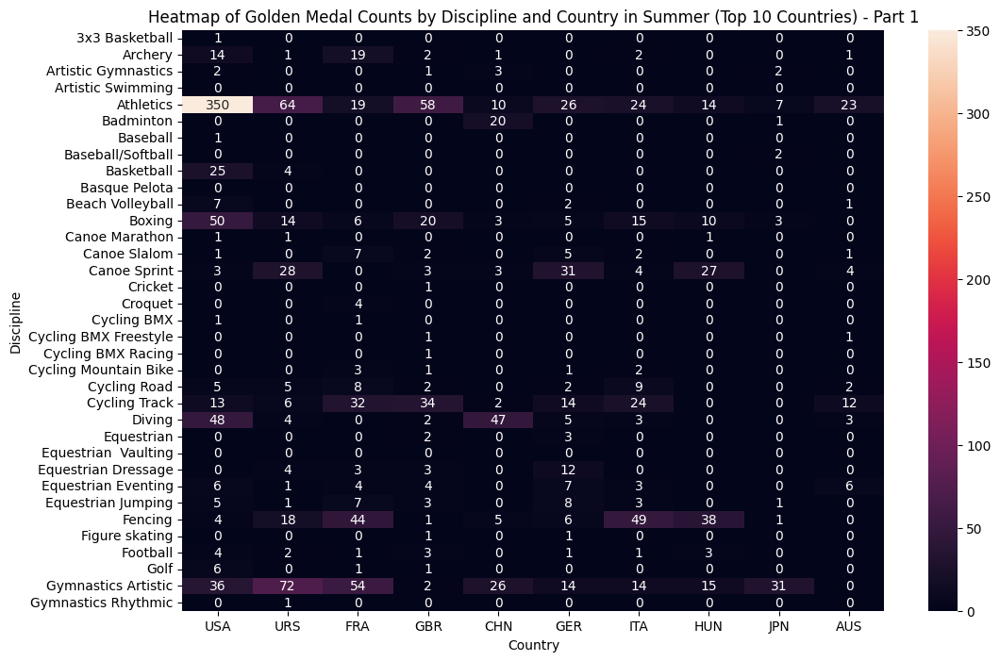

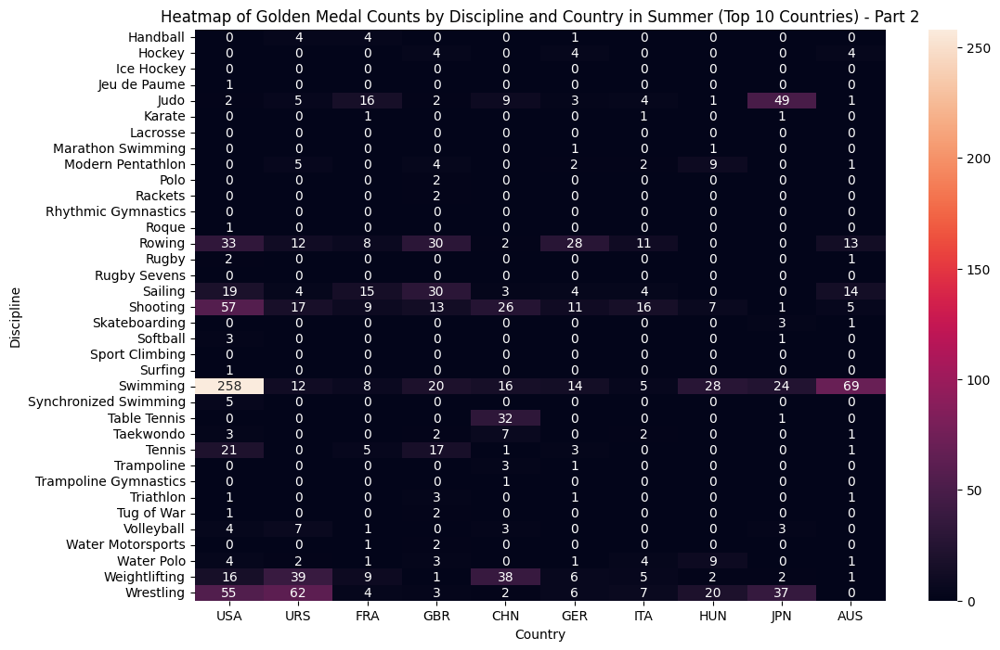

In [19]:
# Split the heatmap_summer DataFrame into two halves
half = len(heatmap_summer) // 2
heatmap_summer_1 = heatmap_summer.iloc[:half]
heatmap_summer_2 = heatmap_summer.iloc[half:]

# Create the first plot
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_summer_1, annot=True, fmt='.0f')
plt.title('Heatmap of Golden Medal Counts by Discipline and Country in Summer (Top 10 Countries) - Part 1')
plt.xlabel('Country')
plt.ylabel('Discipline')
plt.show()

# Create the second plot
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_summer_2, annot=True, fmt='.0f')
plt.title('Heatmap of Golden Medal Counts by Discipline and Country in Summer (Top 10 Countries) - Part 2')
plt.xlabel('Country')
plt.ylabel('Discipline')
plt.show()

In [20]:
df_results_merged = df_results.merge(df_hosts, left_on='slug_game', right_on='game_slug')
df_results_summer = df_results_merged.query('game_season == "Summer"')
df_results_winter = df_results_merged.query('game_season == "Winter"')

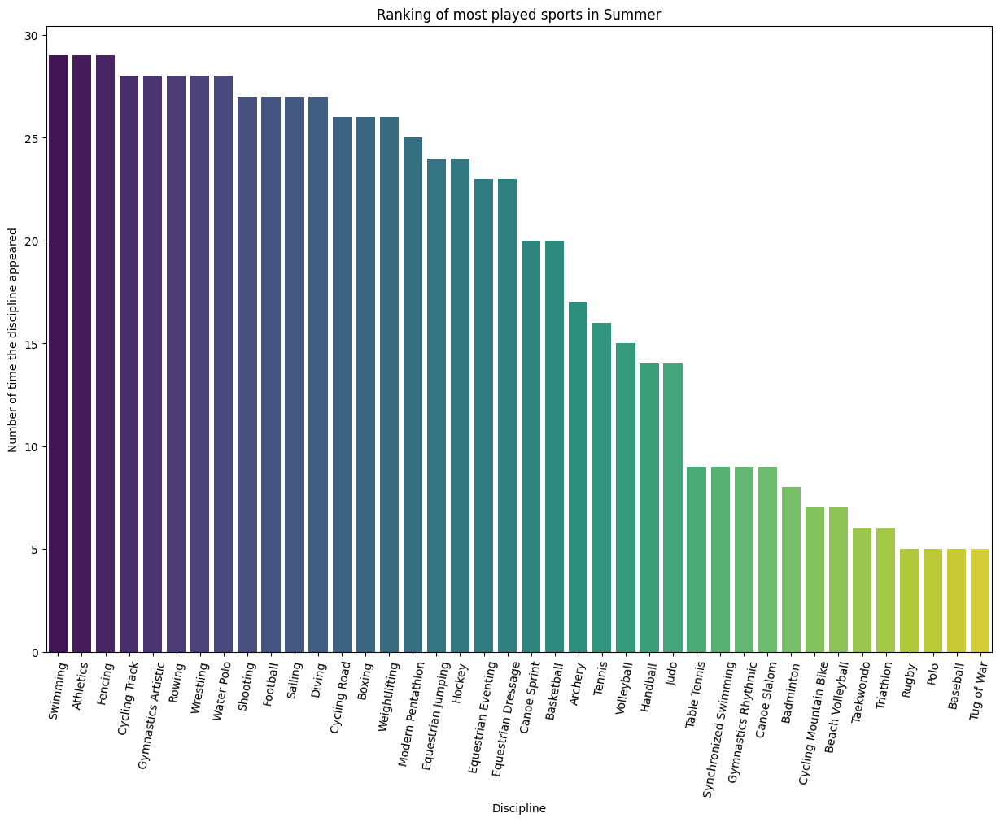

In [21]:
# Get the ranking of most played sports

# drop duplicates [discipline_title, slug_game]
df_results_unique_sport_per_game = df_results_summer.drop_duplicates(subset=['discipline_title', 'slug_game'])

most_played_sports = df_results_unique_sport_per_game['discipline_title'].value_counts().reset_index().sort_values(by='count', ascending=False)

# Plot the ranking of most played sports
plt.figure(figsize=(15, 10))
sns.barplot(data=most_played_sports.head(40), x='discipline_title', y='count', palette='viridis')
plt.title('Ranking of most played sports in Summer')
plt.xlabel('Discipline')
plt.ylabel('Number of time the discipline appeared')
plt.xticks(rotation=80)
plt.show()

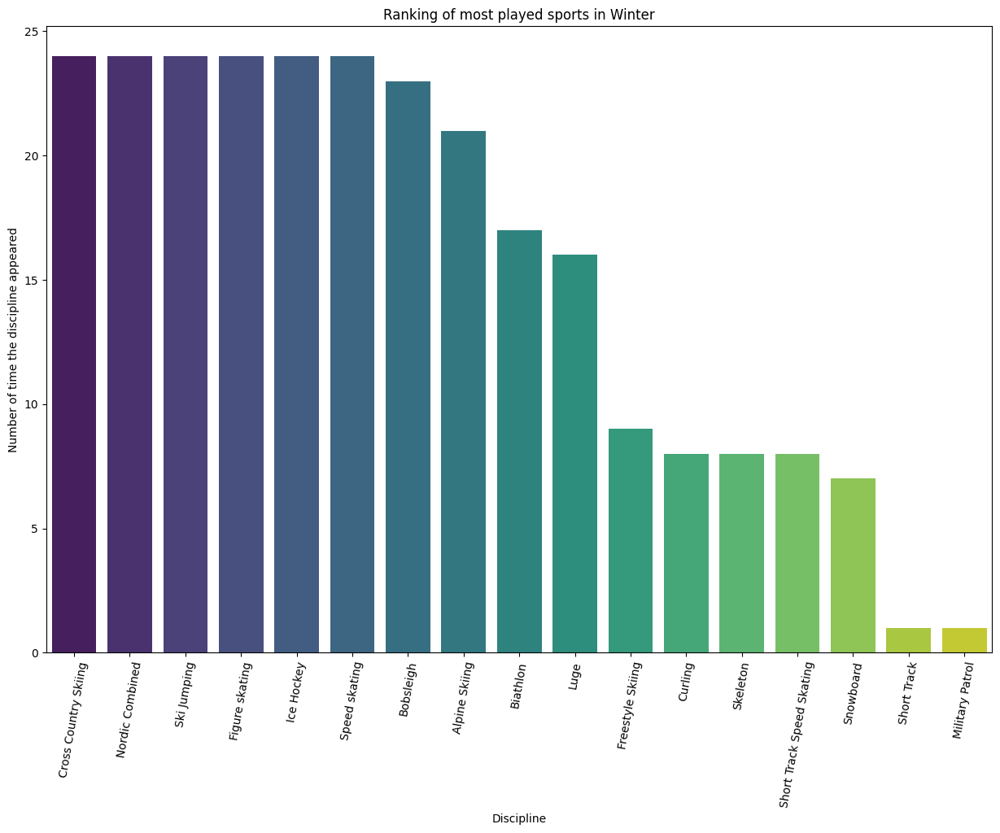

In [22]:
df_results_unique_sport_per_game = df_results_winter.drop_duplicates(subset=['discipline_title', 'slug_game'])

most_played_sports = df_results_unique_sport_per_game['discipline_title'].value_counts().reset_index().sort_values(by='count', ascending=False)

# Plot the ranking of most played sports
plt.figure(figsize=(15, 10))
sns.barplot(data=most_played_sports, x='discipline_title', y='count', palette='viridis')
plt.title('Ranking of most played sports in Winter')
plt.xlabel('Discipline')
plt.ylabel('Number of time the discipline appeared')
plt.xticks(rotation=80)
plt.show()

## Some Analysis

In [23]:
df_hosts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   game_slug        53 non-null     object
 1   game_end_date    53 non-null     object
 2   game_start_date  53 non-null     object
 3   game_location    53 non-null     object
 4   game_name        53 non-null     object
 5   game_season      53 non-null     object
 6   game_year        53 non-null     int64 
dtypes: int64(1), object(6)
memory usage: 3.0+ KB


In [96]:
hosts = df_hosts.copy()

#Make a dataframe with only the country and the year of the games + country in 3 letters
hosts = hosts[['game_year','game_location','game_season']]
hosts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   game_year      53 non-null     int64 
 1   game_location  53 non-null     object
 2   game_season    53 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.4+ KB


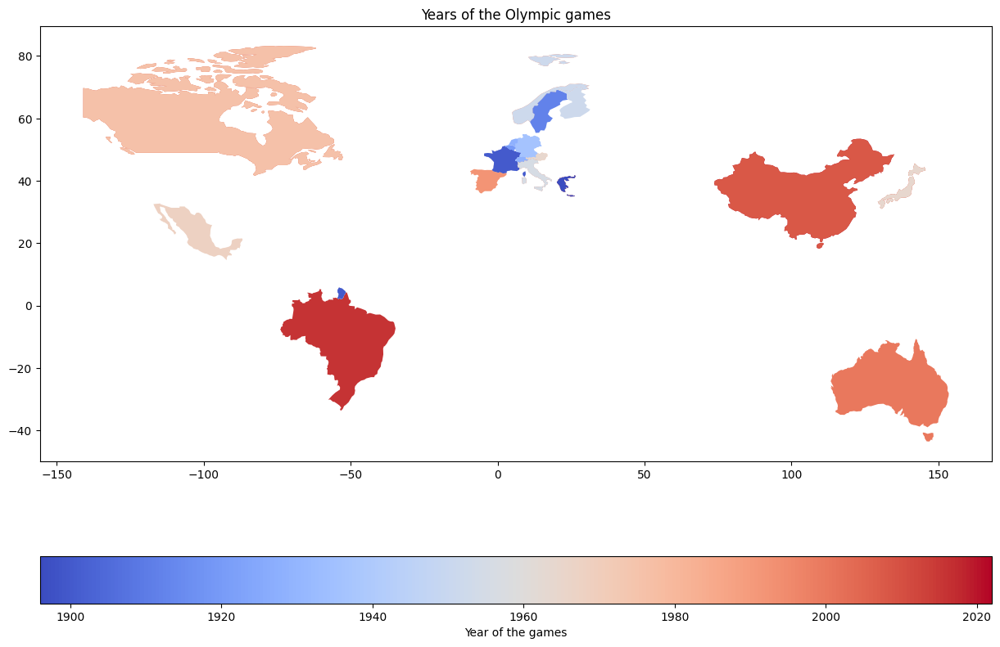

In [88]:
hosts = df_hosts.copy()

#Make a dataframe with only the country and the year of the games + country in 3 letters
hosts = hosts[['game_year','game_location','game_season']]
hosts = hosts.merge(world[['name','iso_a3']], left_on='game_location', right_on='name')
hosts = hosts.drop(columns=['name'])
#hosts['game_year'] = pd.to_datetime(hosts['game_year'], format='%Y')

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

hosts.rename(columns={'country_3_letter_code': 'iso_a3'}, inplace=True)

hosts = world.merge(hosts, how='left', on='iso_a3')

#Drop values of column ['game_year'] that are NaT   
hosts = hosts.dropna(subset=['game_year'])

#plot result in world map around the years
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
hosts.plot(column='game_year', ax=ax, legend=True, cmap='coolwarm', 
                  legend_kwds={'label': "Year of the games", 'orientation': "horizontal"})
plt.title('Years of the Olympic games')
plt.show()


In [91]:
hosts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 35 entries, 3 to 172
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   pop_est        35 non-null     float64 
 1   continent      35 non-null     object  
 2   name           35 non-null     object  
 3   iso_a3         35 non-null     object  
 4   gdp_md_est     35 non-null     int64   
 5   geometry       35 non-null     geometry
 6   game_year      35 non-null     float64 
 7   game_location  35 non-null     object  
 8   game_season    35 non-null     object  
dtypes: float64(2), geometry(1), int64(1), object(5)
memory usage: 2.7+ KB


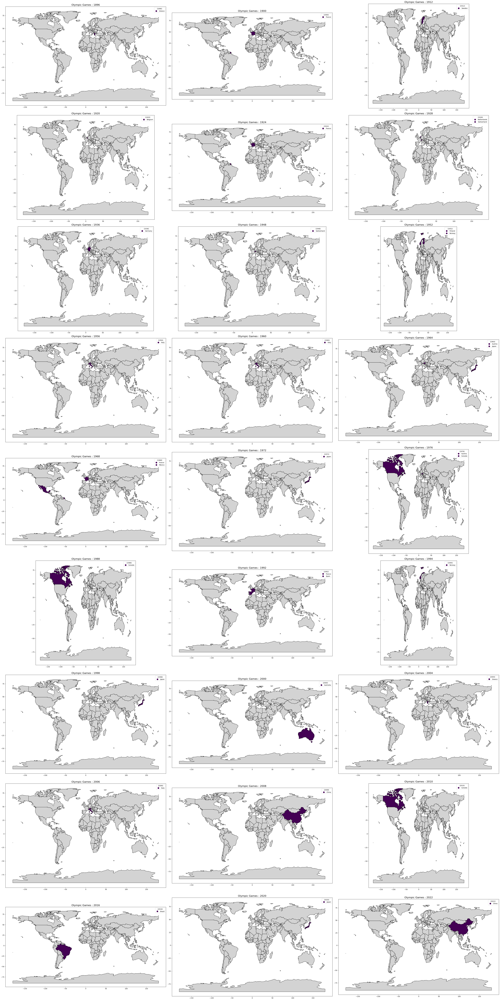

In [84]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Copy the original DataFrame
hosts = df_hosts.copy()

# Make a DataFrame with only the country and the year of the games + country in 3 letters
hosts = hosts[['game_year', 'game_location']].drop_duplicates()
hosts = hosts.merge(world[['name', 'iso_a3']], left_on='game_location', right_on='name')
hosts = hosts.drop(columns=['name'])

# Merge with world GeoDataFrame to get geometry information
hosts = world.merge(hosts, how='left', on='iso_a3')

# Drop rows with missing game_year
hosts = hosts.dropna(subset=['game_year'])

# Define the colormap and normalization
cmap = 'viridis'  # You can choose any colormap you prefer
norm = plt.Normalize(hosts['game_year'].min(), hosts['game_year'].max())

# Get unique years
unique_years = sorted(hosts['game_year'].unique())

# Define subplot layout
num_cols = 3  # Number of columns for subplots
num_rows = (len(unique_years) + num_cols - 1) // num_cols  # Number of rows for subplots


# Increase size of each subplot
subplot_width = 20
subplot_height = 10

# Create subplots with adjusted figsize
fig, axes = plt.subplots(num_rows, num_cols, figsize=(subplot_width * num_cols, subplot_height * num_rows))

# Loop through each unique year and corresponding subplot
for idx, year in enumerate(unique_years):

    hosts_year = hosts[hosts['game_year'] == year]
    

    ax = axes[idx // num_cols, idx % num_cols]
    

    world.plot(ax=ax, color='lightgrey', edgecolor='black')
    

    hosts_year.plot(ax=ax, column='game_location', cmap=cmap, linewidth=0.8, edgecolor='black',
                     legend=True, legend_kwds={'title': f'({int(year)})'},
                     norm=norm)
    
    ax.set_title(f'Olympic Games : {int(year)}', fontsize=16)

plt.tight_layout()
plt.show()


In [78]:
import plotly.express as px

hosts = df_hosts.copy()


# Make a DataFrame with only the country and the year of the games + country in 3 letters
hosts = hosts[['game_year', 'game_season', 'game_location']].drop_duplicates()
hosts = hosts.merge(world[['name', 'iso_a3']], left_on='game_location', right_on='name')
hosts = hosts.drop(columns=['name'])

# Merge with world GeoDataFrame to get geometry information
hosts = world.merge(hosts, how='left', on='iso_a3')

# Drop rows with missing game_year
hosts = hosts.dropna(subset=['game_year'])

# Sort the DataFrame by game_year in chronological order
hosts = hosts.sort_values(by='game_year')

# Create a choropleth map with Plotly
fig = px.choropleth(hosts, 
                    locations='iso_a3',  # ISO 3-letter country codes
                    color='game_season',   # Color the map based on game_year
                    hover_name='name',   # Country name shown when hovering
                    animation_frame='game_year',  # Use game_year for animation
                    category_orders={'game_season': ['Winter', 'Summer']},  # Specify the order of game_season
                    color_discrete_sequence=px.colors.qualitative.Set1,  # Assign different colors to Winter and Summer
                    projection='natural earth'  # Choose map projection
                   )

# Update layout to customize the legend
fig.update_layout(
    title='Countries Hosting Olympic Games by Year',
    width=1000,
    height=600,
    geo=dict(
        showframe=True,
        showcoastlines=True,
    ),
    coloraxis_showscale=True,  # Hide the color axis
    legend=dict(
        title='Year of the Olympic Games',  # Set legend title
        itemsizing='constant'  # Set legend item sizing to constant
    )
)

# Show the interactive plot
fig.show()


## To Improve :
# - Show only the name of country and change game_year to YEAR = 



In [77]:
import plotly.express as px

hosts = df_hosts.copy()


# Make a DataFrame with only the country and the year of the games + country in 3 letters
hosts = hosts[['game_year', 'game_season', 'game_location']].drop_duplicates()
hosts = hosts.merge(world[['name', 'iso_a3']], left_on='game_location', right_on='name')
hosts = hosts.drop(columns=['name'])

# Merge with world GeoDataFrame to get geometry information
hosts = world.merge(hosts, how='left', on='iso_a3')

# Drop rows with missing game_year
hosts = hosts.dropna(subset=['game_year'])

# Sort the DataFrame by game_year in chronological order
hosts = hosts.sort_values(by='game_year')

# Create a choropleth map with Plotly
fig = px.choropleth(hosts, 
                    locations='iso_a3',  # ISO 3-letter country codes
                    color='game_season',   # Color the map based on game_year
                    hover_name='name',   # Country name shown when hovering
                    animation_frame='game_year',  # Use game_year for animation
                    category_orders={'game_season': ['Winter', 'Summer']},  # Specify the order of game_season
                    color_discrete_sequence=px.colors.qualitative.Set1,  # Assign different colors to Winter and Summer
                    projection='natural earth'  # Choose map projection
                   )

# Update layout to customize the legend
fig.update_layout(
    title='Countries Hosting Olympic Games by Year',
    width=1200,
    height=800,
    geo=dict(
        showframe=True,
        showcoastlines=True,
        showcountries=True,
        showocean=True,
        countrywidth=0.5,
        landcolor='white',
        oceancolor='lightblue',
        coastlinecolor='black',
        framecolor='black'
    ),
    coloraxis_showscale=True,  # Hide the color axis
    legend=dict(
        title='Year of the Olympic Games',  # Set legend title
        itemsizing='constant'  # Set legend item sizing to constant
    ),
    hoverlabel=dict(
        bgcolor='white',
        font_size=16,
    )
)

# Show the interactive plot
fig.show()


